In [105]:
import numpy as np
import matplotlib.pyplot as plt
import time
from scipy.special import erf
from mpl_toolkits.mplot3d import Axes3D

=== Problem 1: Sploosh Algorithm for Integration ===
Exact value of the integral: -6.0
N=100, Integral=-6.400000, Statistical Error=0.763151, Actual Error=0.400000, Time=0.000091s
N=1000, Integral=-5.744000, Statistical Error=0.246898, Actual Error=0.256000, Time=0.000462s
N=10000, Integral=-6.008000, Statistical Error=0.077439, Actual Error=0.008000, Time=0.005254s
N=100000, Integral=-5.995200, Statistical Error=0.024499, Actual Error=0.004800, Time=0.051240s
N=1000000, Integral=-5.992128, Statistical Error=0.007748, Actual Error=0.007872, Time=0.468789s

Results Table:
N	Integral	Stat Error	Actual Error	Time (s)
----------------------------------------------------------------------
100	-6.400000	0.763151	0.400000	0.000091
1000	-5.744000	0.246898	0.256000	0.000462
10000	-6.008000	0.077439	0.008000	0.005254
100000	-5.995200	0.024499	0.004800	0.051240
1000000	-5.992128	0.007748	0.007872	0.468789


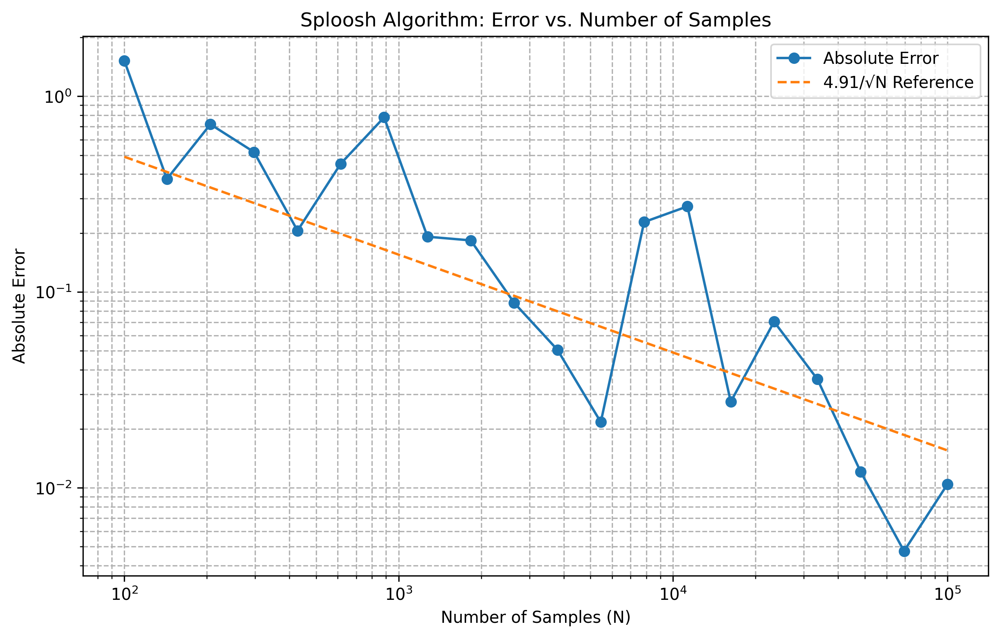

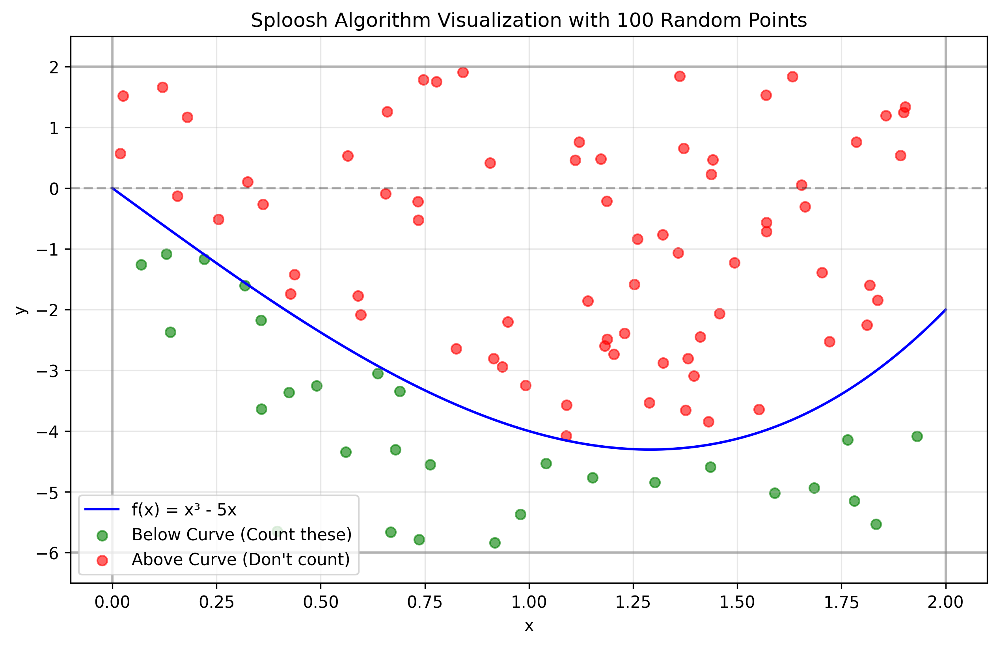

In [106]:
np.random.seed(12)

def sploosh_integration(f, a, b, y_min, y_max, N):
    N_below = 0
    total_height = y_max - y_min
    
    for i in range(N):
        x = a + (b - a) * np.random.random()
        y = y_min + total_height * np.random.random()
        
        if y < f(x):
            N_below += 1
    
    p = N_below / N
    
    rectangle_area = (b - a) * total_height
    below_curve_area = rectangle_area * p
    
    integral = below_curve_area - (b - a) * (-y_min)
    
    error = rectangle_area * np.sqrt(p * (1 - p) / N)
    
    return integral, error, N_below

def f1(x):
    return x**3 - 5*x

def analytical_f1(a, b):
    return (b**4/4 - 5*b**2/2) - (a**4/4 - 5*a**2/2)

print("=== Problem 1: Sploosh Algorithm for Integration ===")
a, b = 0, 2
y_min = -6
y_max = 2
exact_value = analytical_f1(a, b)
print(f"Exact value of the integral: {exact_value}")

N_values = [100, 1000, 10000, 100000, 1000000]
results = []

for N in N_values:
    start_time = time.time()
    integral, error, N_below = sploosh_integration(f1, a, b, y_min, y_max, N)
    execution_time = time.time() - start_time
    
    actual_error = abs(integral - exact_value)
    results.append([N, integral, error, actual_error, execution_time])
    print(f"N={N}, Integral={integral:.6f}, Statistical Error={error:.6f}, Actual Error={actual_error:.6f}, Time={execution_time:.6f}s")

print("\nResults Table:")
print("N\tIntegral\tStat Error\tActual Error\tTime (s)")
print("-" * 70)
for result in results:
    print(f"{result[0]}\t{result[1]:.6f}\t{result[2]:.6f}\t{result[3]:.6f}\t{result[4]:.6f}")

N_range = np.logspace(2, 5, 20, dtype=int)
errors = []

for N in N_range:
    integral, _, _ = sploosh_integration(f1, a, b, y_min, y_max, N)
    errors.append(abs(integral - exact_value))

scaling_factor = np.mean([errors[i] * np.sqrt(N_range[i]) for i in range(-5, 0)])

plt.figure(figsize=(10, 6), dpi=300)
plt.loglog(N_range, errors, 'o-', label='Absolute Error')
plt.loglog(N_range, scaling_factor / np.sqrt(N_range), '--', label=f'{scaling_factor:.2f}/√N Reference')
plt.xlabel('Number of Samples (N)')
plt.ylabel('Absolute Error')
plt.title('Sploosh Algorithm: Error vs. Number of Samples')
plt.grid(True, which="both", ls="--")
plt.legend()
plt.savefig('sploosh_error.png', dpi=300, bbox_inches='tight')
plt.show()

def visualize_sploosh(N=100):
    x_points = a + (b - a) * np.random.random(N)
    y_points = y_min + (y_max - y_min) * np.random.random(N)
    
    x_vals = np.linspace(a, b, 1000)
    y_vals = [f1(x) for x in x_vals]
    
    below_curve = []
    above_curve = []
    
    for x, y in zip(x_points, y_points):
        if y < f1(x):
            below_curve.append((x, y))
        else:
            above_curve.append((x, y))
    
    below_x, below_y = zip(*below_curve) if below_curve else ([], [])
    above_x, above_y = zip(*above_curve) if above_curve else ([], [])
    
    plt.figure(figsize=(10, 6), dpi=300)
    plt.plot(x_vals, y_vals, 'b-', label='f(x) = x³ - 5x')
    plt.scatter(below_x, below_y, c='green', alpha=0.6, label='Below Curve (Count these)')
    plt.scatter(above_x, above_y, c='red', alpha=0.6, label='Above Curve (Don\'t count)')
    
    plt.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    plt.axhline(y=y_min, color='gray', linestyle='-', alpha=0.5)
    plt.axhline(y=y_max, color='gray', linestyle='-', alpha=0.5)
    plt.axvline(x=a, color='gray', linestyle='-', alpha=0.5)
    plt.axvline(x=b, color='gray', linestyle='-', alpha=0.5)
    
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(f'Sploosh Algorithm Visualization with {N} Random Points')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    plt.xlim(a - 0.1, b + 0.1)
    plt.ylim(y_min - 0.5, y_max + 0.5)
    
    plt.savefig('sploosh_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

visualize_sploosh(100)


=== Problem 2: Simple Sampling vs. Importance Sampling ===
Exact value of the integral: 0.882081
N=100:
 Simple Sampling: Integral=0.856675, Stat Error=0.069818, Actual Error=0.025407, Time=0.001061s
 Importance Sampling: Integral=0.922121, Stat Error=0.023679, Actual Error=0.040040, Time=0.000960s
N=1000:
 Simple Sampling: Integral=0.842413, Stat Error=0.021373, Actual Error=0.039668, Time=0.000845s
 Importance Sampling: Integral=0.898856, Stat Error=0.008704, Actual Error=0.016775, Time=0.000736s
N=10000:
 Simple Sampling: Integral=0.882741, Stat Error=0.006866, Actual Error=0.000659, Time=0.006201s
 Importance Sampling: Integral=0.881871, Stat Error=0.002857, Actual Error=0.000210, Time=0.005325s
N=100000:
 Simple Sampling: Integral=0.882516, Stat Error=0.002180, Actual Error=0.000434, Time=0.046178s
 Importance Sampling: Integral=0.880449, Stat Error=0.000907, Actual Error=0.001632, Time=0.038028s
N=1000000:
 Simple Sampling: Integral=0.883371, Stat Error=0.000689, Actual Error=0.

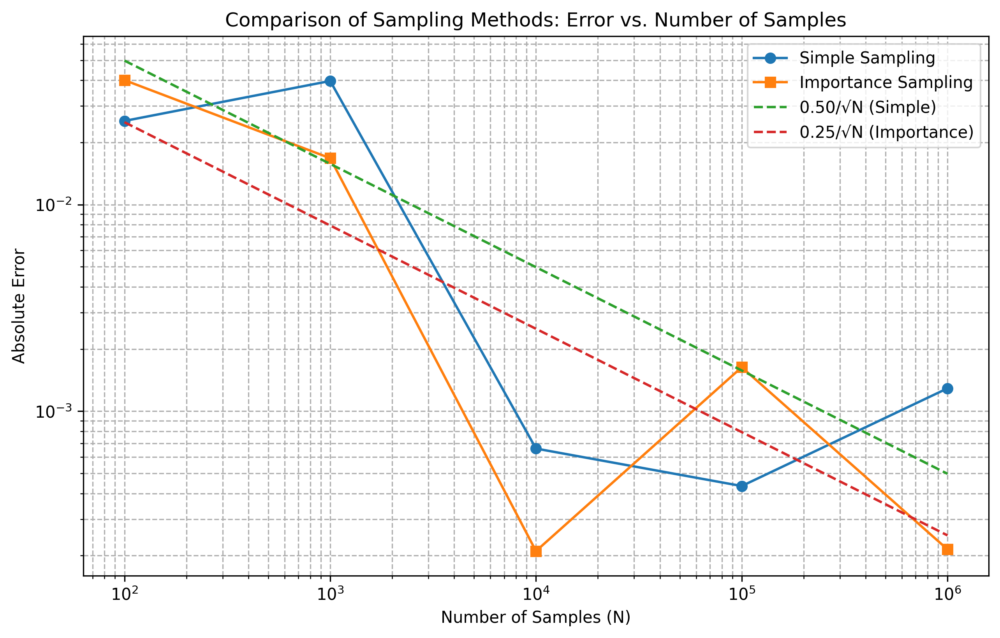

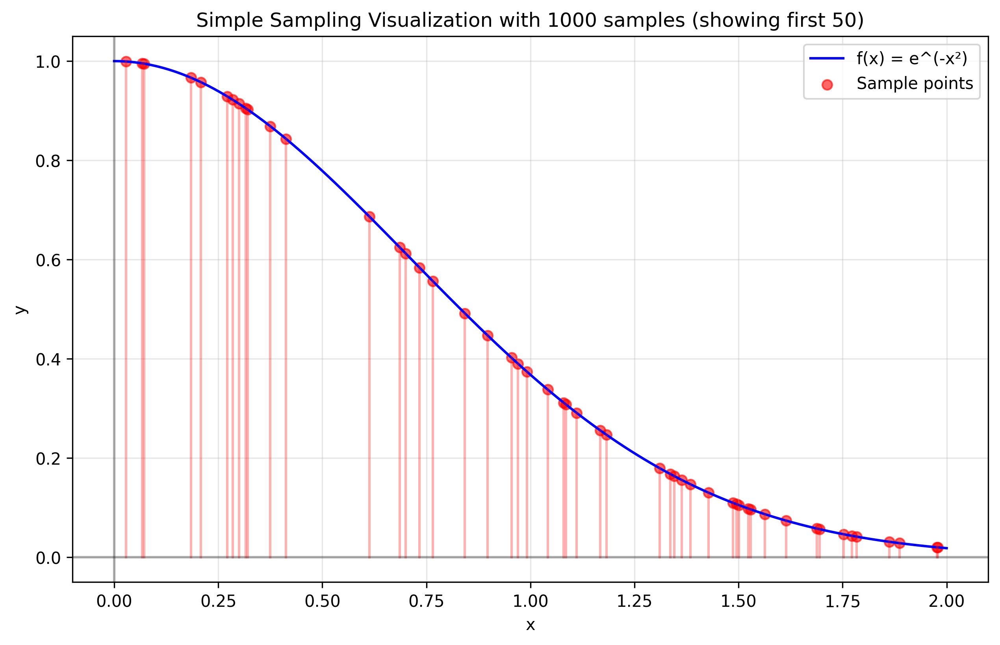

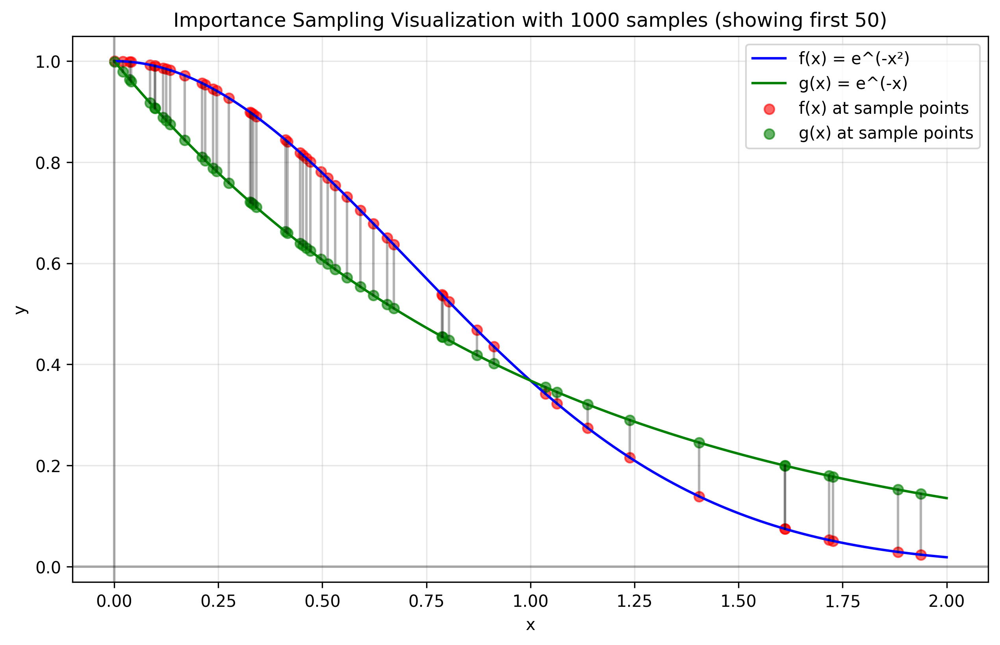

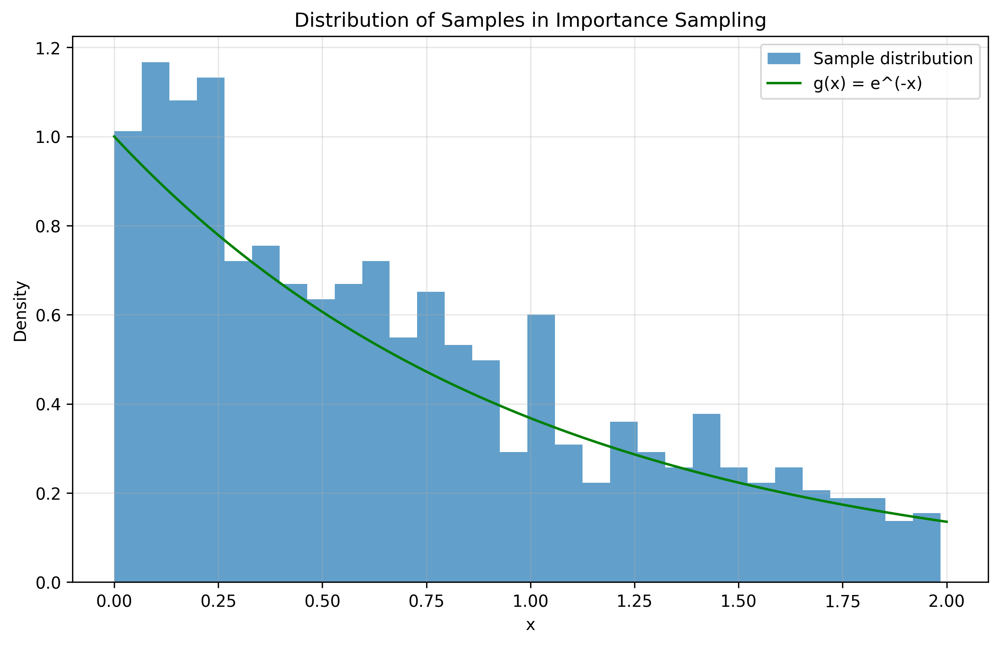

In [107]:
np.random.seed(12)

def simple_sampling(f, a, b, N):
    x_samples = a + (b - a) * np.random.random(N)
    f_values = np.array([f(x) for x in x_samples])
    mean = np.mean(f_values)
    variance = np.var(f_values, ddof=1)
    integral = (b - a) * mean
    error = (b - a) * np.sqrt(variance / N)
    return integral, error, (x_samples, f_values)

def generate_exp_samples(N, lambda_param=1.0):
    u = np.random.random(N)
    return -np.log(1 - u) / lambda_param

def importance_sampling(f, a, b, N, g_integral=None):
    if g_integral is None:
        g_integral = 1 - np.exp(-b)
    samples = generate_exp_samples(N)
    valid_indices = (samples >= a) & (samples <= b)
    valid_samples = samples[valid_indices]
    if len(valid_samples) == 0:
        return 0, float('inf'), ([], [])
    g_values = np.exp(-valid_samples)
    f_values = np.array([f(x) for x in valid_samples])
    ratios = f_values / g_values
    mean = np.mean(ratios)
    variance = np.var(ratios, ddof=1)
    integral = g_integral * mean
    error = g_integral * np.sqrt(variance / len(valid_samples))
    return integral, error, (valid_samples, ratios)

def f2(x):
    return np.exp(-x**2)

def g2(x):
    return np.exp(-x)

def analytical_f2(a, b):
    return np.sqrt(np.pi)/2 * (erf(b) - erf(a))

def visualize_simple_sampling(samples, f_values, N):
    x_grid = np.linspace(0, 2, 1000)
    y_grid = [f2(x) for x in x_grid]
    plt.figure(figsize=(10, 6), dpi=300)
    plt.plot(x_grid, y_grid, 'b-', label='f(x) = e^(-x²)')
    for i in range(min(50, len(samples))):
        plt.plot([samples[i], samples[i]], [0, f_values[i]], 'r-', alpha=0.3)
    plt.scatter(samples[:min(50, len(samples))], f_values[:min(50, len(samples))],
                c='red', alpha=0.6, label='Sample points')
    plt.axhline(y=0, color='k', linestyle='-', alpha=0.3)
    plt.axvline(x=0, color='k', linestyle='-', alpha=0.3)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(f'Simple Sampling Visualization with {N} samples (showing first 50)')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.savefig('simple_sampling_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_importance_sampling(samples, ratios, N):
    x_grid = np.linspace(0, 2, 1000)
    y_f = [f2(x) for x in x_grid]
    y_g = [g2(x) for x in x_grid]
    plt.figure(figsize=(10, 6), dpi=300)
    plt.plot(x_grid, y_f, 'b-', label='f(x) = e^(-x²)')
    plt.plot(x_grid, y_g, 'g-', label='g(x) = e^(-x)')
    f_values = [f2(x) for x in samples[:min(50, len(samples))]]
    g_values = [g2(x) for x in samples[:min(50, len(samples))]]
    plt.scatter(samples[:min(50, len(samples))], f_values, c='red', alpha=0.6,
                label='f(x) at sample points')
    plt.scatter(samples[:min(50, len(samples))], g_values, c='green', alpha=0.6,
                label='g(x) at sample points')
    for i in range(min(50, len(samples))):
        plt.plot([samples[i], samples[i]], [f_values[i], g_values[i]], 'k-', alpha=0.3)
    plt.axhline(y=0, color='k', linestyle='-', alpha=0.3)
    plt.axvline(x=0, color='k', linestyle='-', alpha=0.3)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(f'Importance Sampling Visualization with {N} samples (showing first 50)')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.savefig('importance_sampling_visualization.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    plt.figure(figsize=(10, 6), dpi=300)
    plt.hist(samples, bins=30, alpha=0.7, density=True, label='Sample distribution')
    plt.plot(x_grid, y_g, 'g-', label='g(x) = e^(-x)')
    plt.xlabel('x')
    plt.ylabel('Density')
    plt.title('Distribution of Samples in Importance Sampling')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.savefig('importance_sampling_distribution.png', dpi=300, bbox_inches='tight')
    plt.show()

print("\n=== Problem 2: Simple Sampling vs. Importance Sampling ===")
a, b = 0, 2
exact_value = analytical_f2(a, b)
print(f"Exact value of the integral: {exact_value:.6f}")

N_values = [100, 1000, 10000, 100000, 1000000]
simple_results = []
importance_results = []
g_integral = 1 - np.exp(-b)

for N in N_values:
    start_time = time.time()
    simple_integral, simple_error, simple_samples = simple_sampling(f2, a, b, N)
    simple_time = time.time() - start_time
    simple_actual_error = abs(simple_integral - exact_value)
    
    start_time = time.time()
    importance_integral, importance_error, importance_samples = importance_sampling(f2, a, b, N, g_integral)
    importance_time = time.time() - start_time
    importance_actual_error = abs(importance_integral - exact_value)
    
    simple_results.append([N, simple_integral, simple_error, simple_actual_error, simple_time])
    importance_results.append([N, importance_integral, importance_error, importance_actual_error, importance_time])
    
    print(f"N={N}:")
    print(f" Simple Sampling: Integral={simple_integral:.6f}, Stat Error={simple_error:.6f}, "
          f"Actual Error={simple_actual_error:.6f}, Time={simple_time:.6f}s")
    print(f" Importance Sampling: Integral={importance_integral:.6f}, Stat Error={importance_error:.6f}, "
          f"Actual Error={importance_actual_error:.6f}, Time={importance_time:.6f}s")

print("\nComparison Table:")
print("N\tSimple Int\tSimple Err\tImportance Int\tImportance Err")
print("-" * 70)
for s, i in zip(simple_results, importance_results):
    print(f"{s[0]}\t{s[1]:.6f}\t{s[3]:.6f}\t{i[1]:.6f}\t{i[3]:.6f}")

plt.figure(figsize=(10, 6), dpi=300)
simple_N = [r[0] for r in simple_results]
simple_errors = [r[3] for r in simple_results]
importance_errors = [r[3] for r in importance_results]
scaling_factor_simple = np.mean([simple_errors[i] * np.sqrt(simple_N[i]) for i in range(-3, 0)])
scaling_factor_importance = np.mean([importance_errors[i] * np.sqrt(simple_N[i]) for i in range(-3, 0)])

plt.loglog(simple_N, simple_errors, 'o-', label='Simple Sampling')
plt.loglog(simple_N, importance_errors, 's-', label='Importance Sampling')
plt.loglog(simple_N, scaling_factor_simple / np.sqrt(simple_N), '--',
           label=f'{scaling_factor_simple:.2f}/√N (Simple)')
plt.loglog(simple_N, scaling_factor_importance / np.sqrt(simple_N), '--',
           label=f'{scaling_factor_importance:.2f}/√N (Importance)')
plt.xlabel('Number of Samples (N)')
plt.ylabel('Absolute Error')
plt.title('Comparison of Sampling Methods: Error vs. Number of Samples')
plt.grid(True, which="both", ls="--")
plt.legend()
plt.savefig('sampling_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

_, _, (samples, f_values) = simple_sampling(f2, a, b, 1000)
visualize_simple_sampling(samples, f_values, 1000)

_, _, (imp_samples, ratios) = importance_sampling(f2, a, b, 1000, g_integral)
visualize_importance_sampling(imp_samples, ratios, 1000)


=== Problem 3: Center of Mass of a Sphere with Density Variations ===

Testing with linear density distribution:
Analytical center of mass: (0, 0, 0.06666666666666667)
N=1000, Center of Mass=[-0.00149418 -0.0219383   0.05332105], Statistical Error=0.025048, Actual Error=0.025722, Time=0.001260s
N=10000, Center of Mass=[-0.00225656 -0.00442008  0.07984762], Statistical Error=0.008127, Actual Error=0.014084, Time=0.002670s
N=100000, Center of Mass=[-0.00095438  0.00191458  0.06334602], Statistical Error=0.002557, Actual Error=0.003950, Time=0.026878s
N=1000000, Center of Mass=[-0.00076661 -0.00059625  0.06729288], Statistical Error=0.000811, Actual Error=0.001156, Time=0.262471s

Results Table:
N	Center of Mass			Stat Error	Actual Error	Time (s)
--------------------------------------------------------------------------------
1000	(-0.0015, -0.0219, 0.0533)	0.025048	0.025722	0.001260
10000	(-0.0023, -0.0044, 0.0798)	0.008127	0.014084	0.002670
100000	(-0.0010, 0.0019, 0.0633)	0.002557	0.0

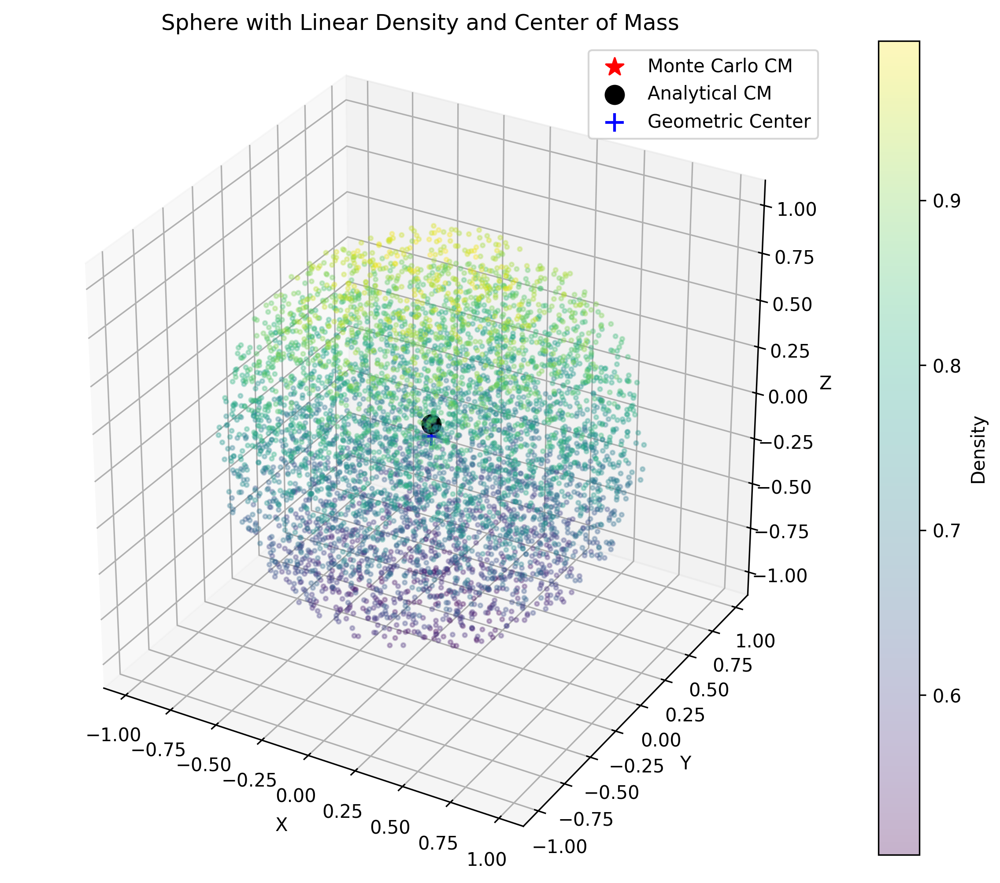

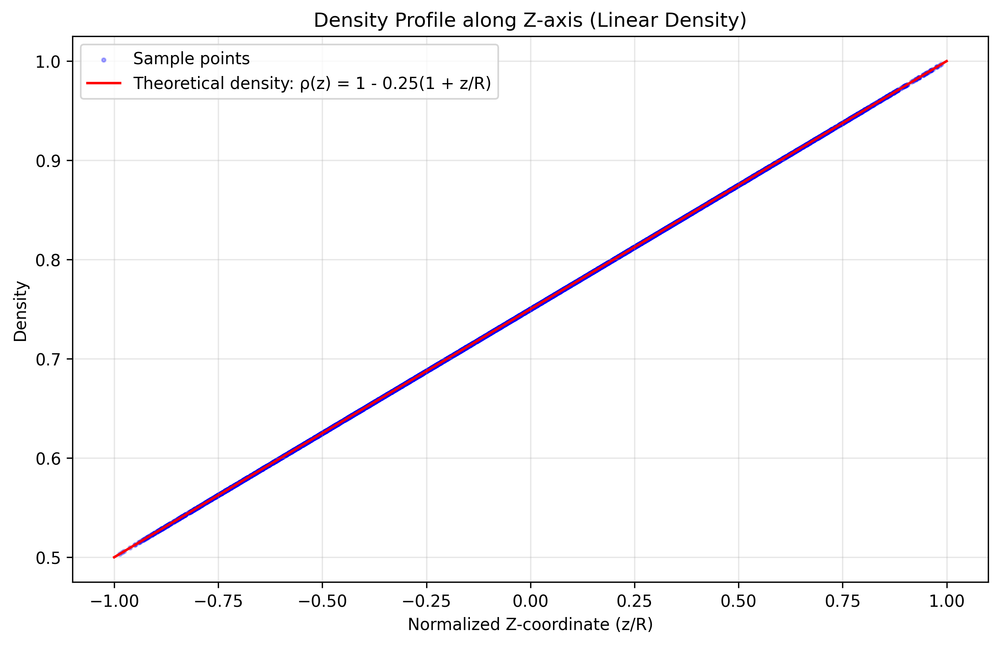

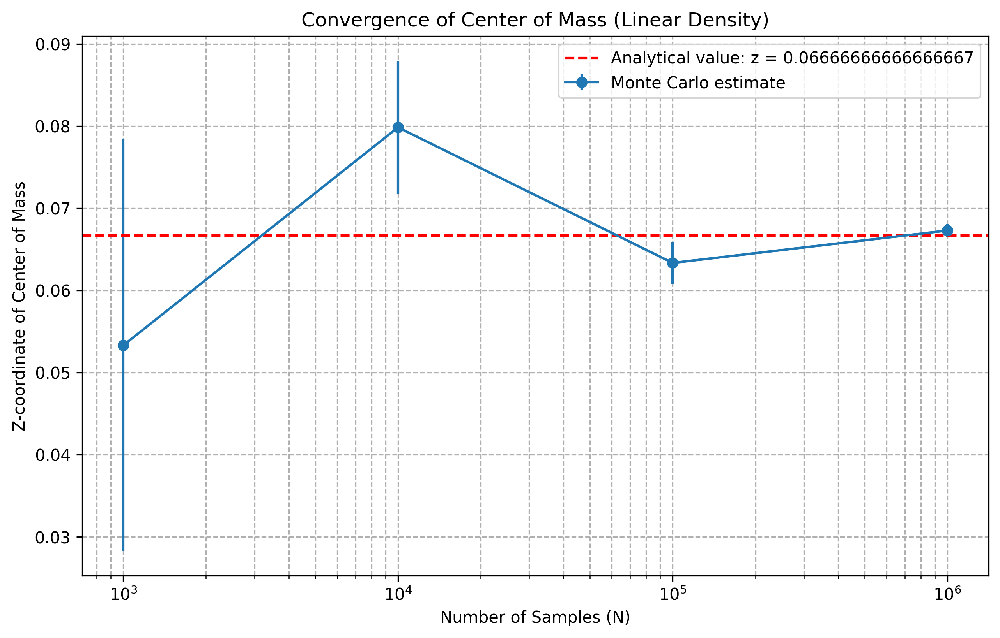

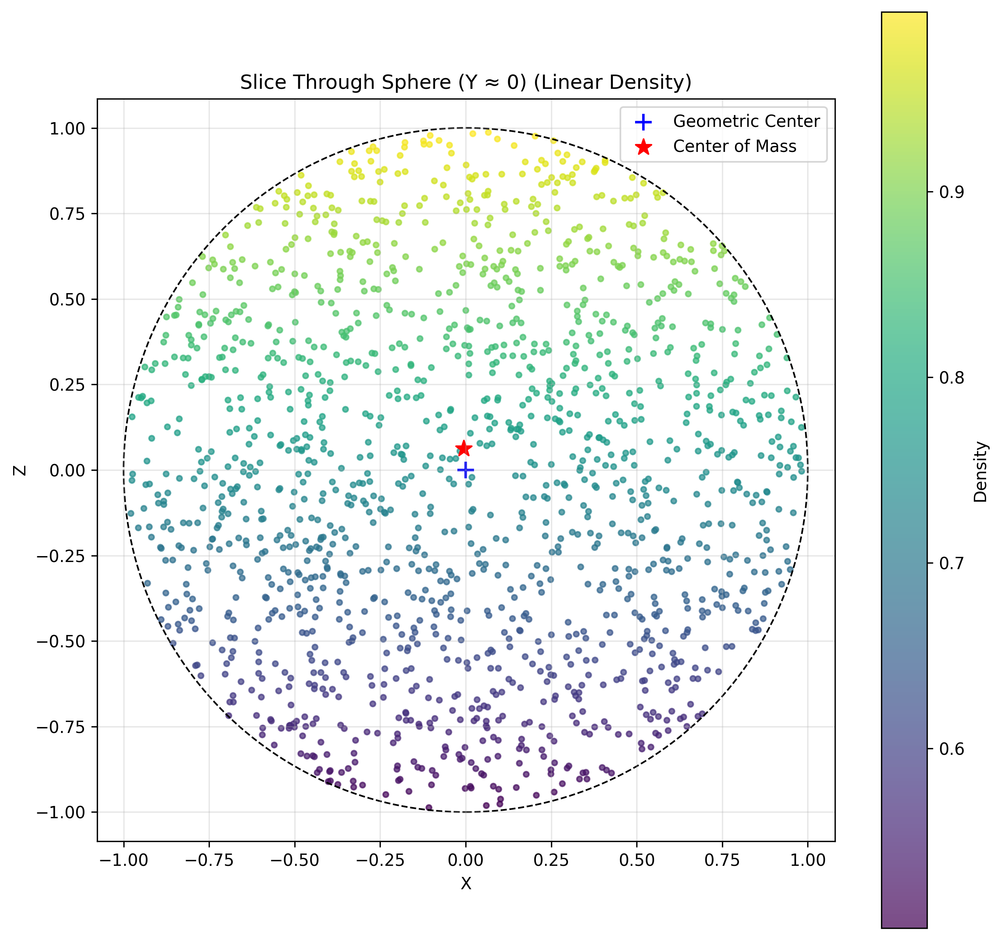

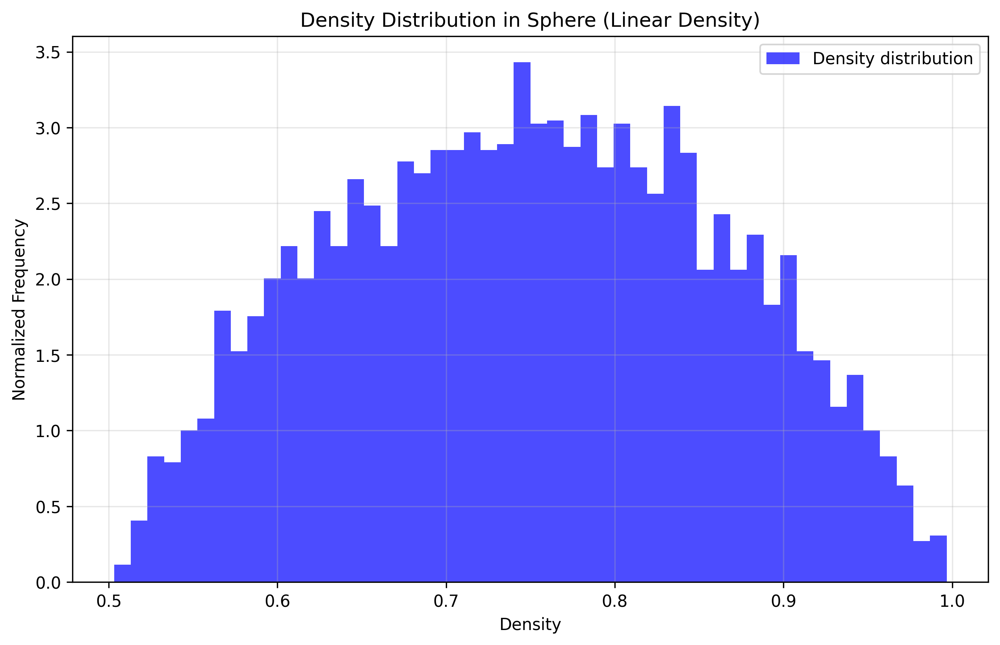

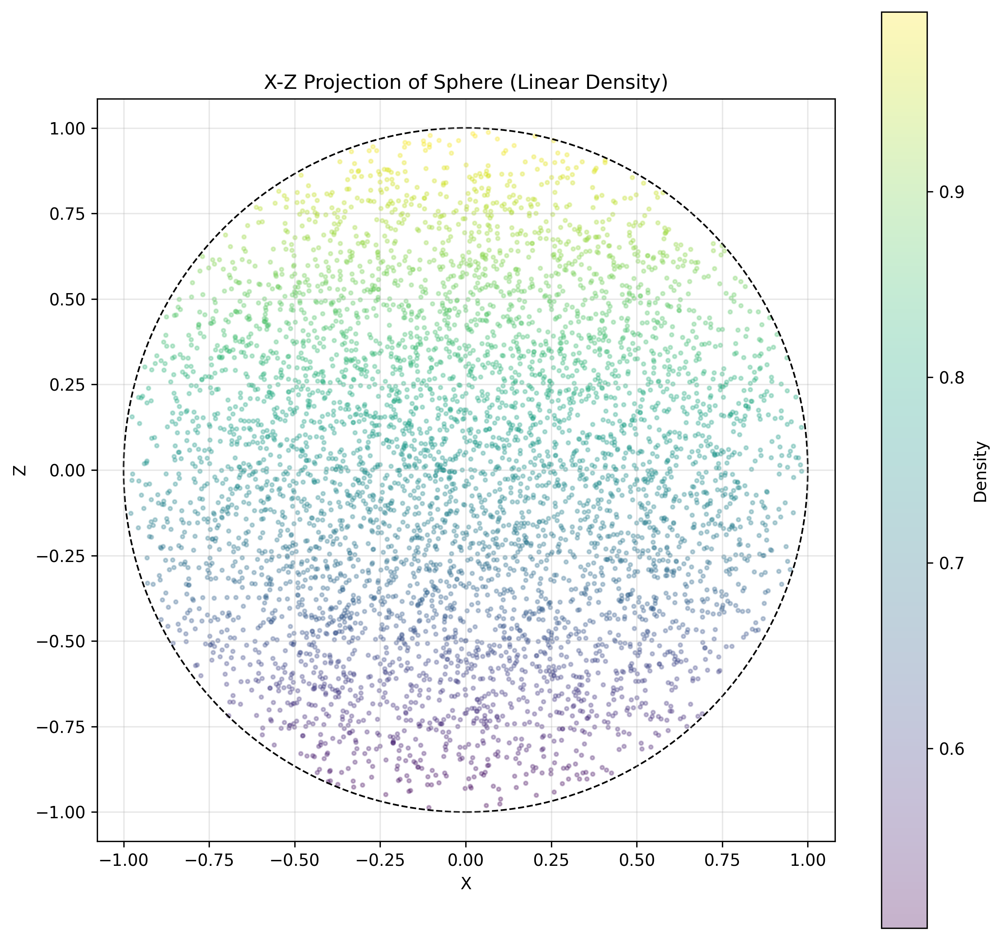

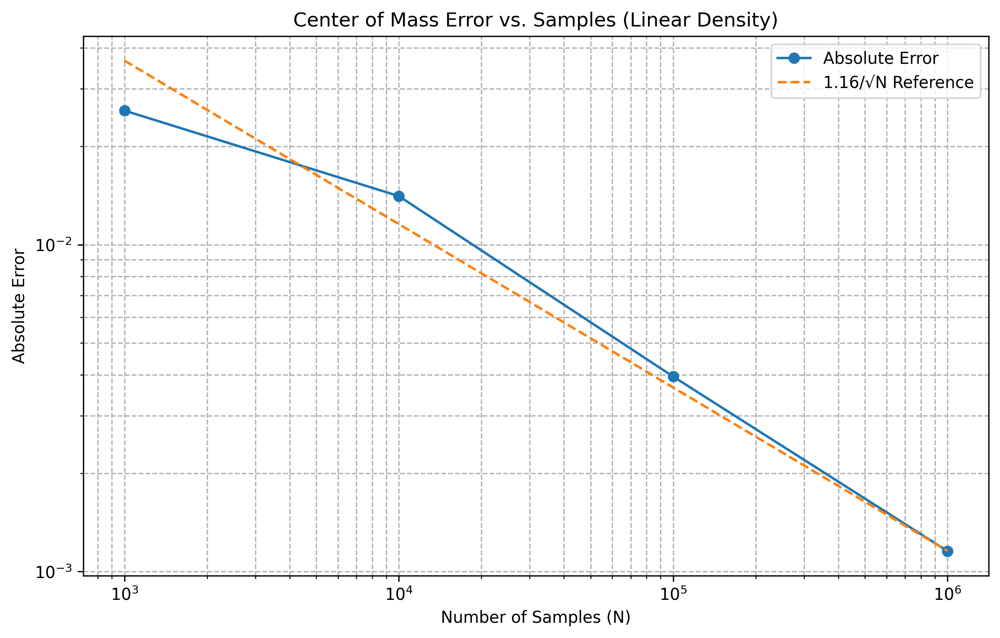


Testing with constant density distribution:
Analytical center of mass: (0, 0, 0)
N=1000, Center of Mass=[-0.00291621  0.00230934 -0.01824632], Statistical Error=0.033513, Actual Error=0.018622, Time=0.000806s
N=10000, Center of Mass=[-0.00245146  0.00628982  0.01145955], Statistical Error=0.010664, Actual Error=0.013300, Time=0.003470s
N=100000, Center of Mass=[ 0.00165623  0.00237842 -0.00167269], Statistical Error=0.003375, Actual Error=0.003346, Time=0.024362s
N=1000000, Center of Mass=[ 0.00030807 -0.00039547 -0.00033185], Statistical Error=0.001071, Actual Error=0.000601, Time=0.233164s

Results Table:
N	Center of Mass			Stat Error	Actual Error	Time (s)
--------------------------------------------------------------------------------
1000	(-0.0029, 0.0023, -0.0182)	0.033513	0.018622	0.000806
10000	(-0.0025, 0.0063, 0.0115)	0.010664	0.013300	0.003470
100000	(0.0017, 0.0024, -0.0017)	0.003375	0.003346	0.024362
1000000	(0.0003, -0.0004, -0.0003)	0.001071	0.000601	0.233164


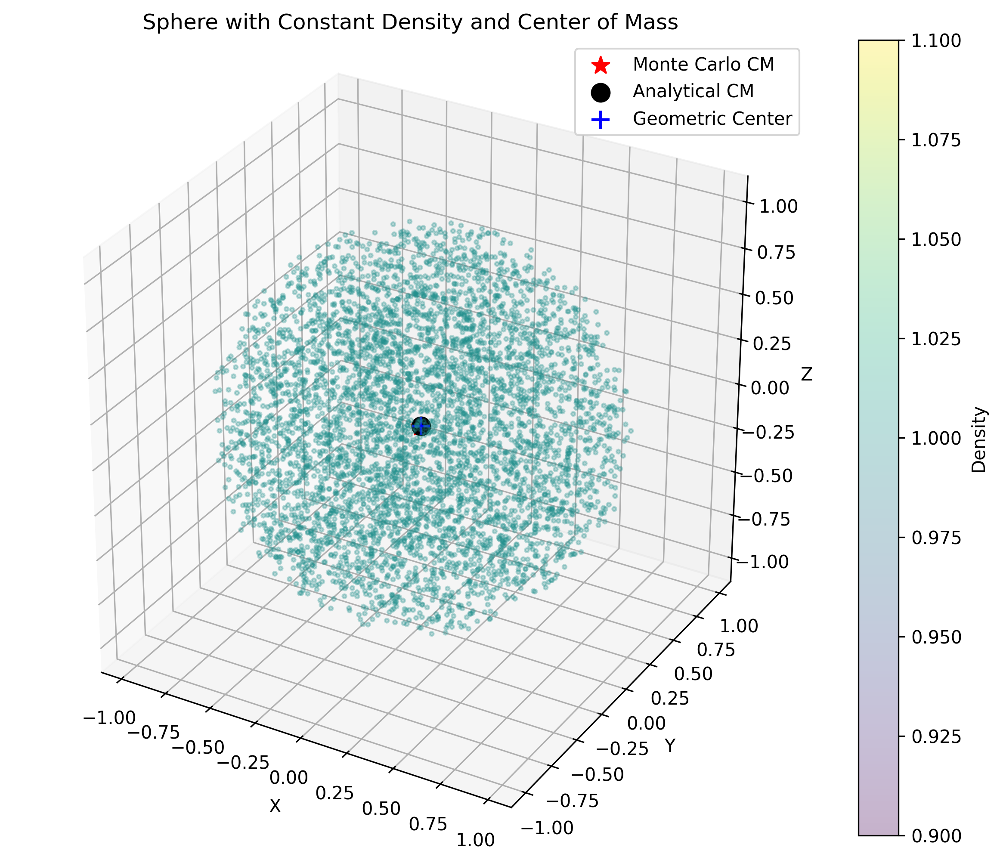

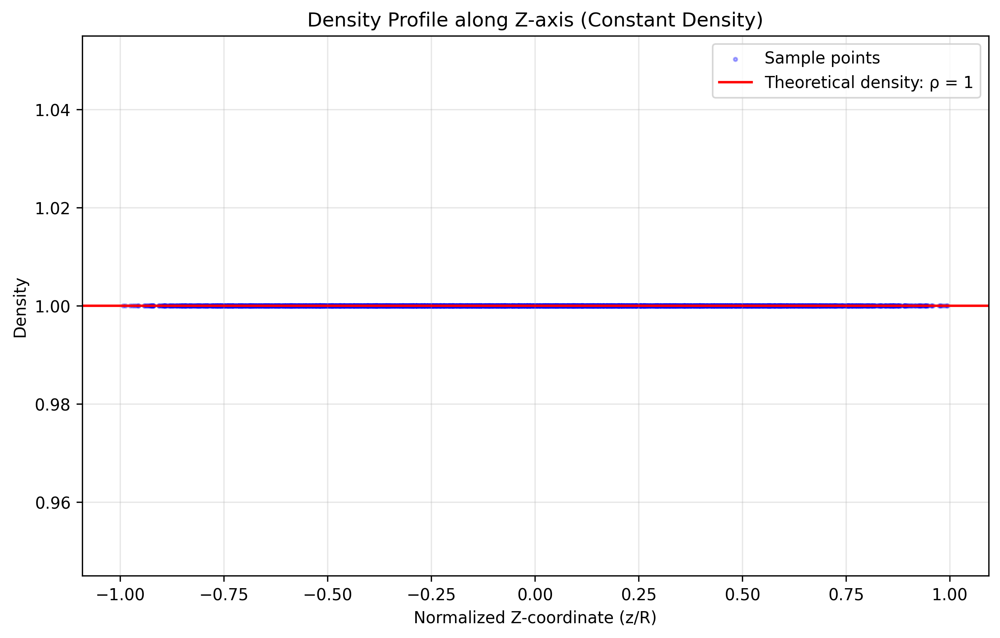

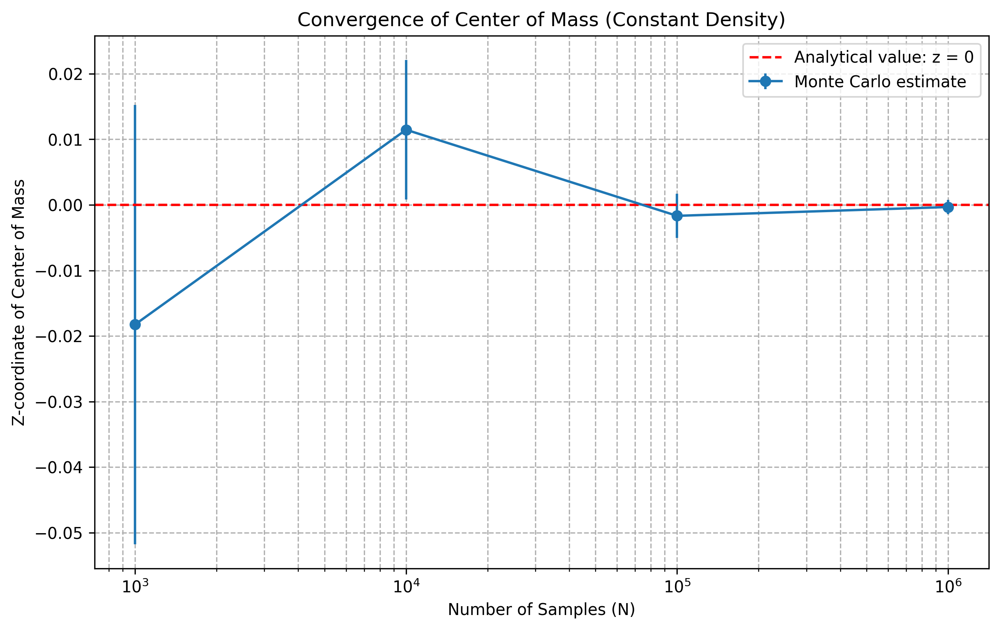

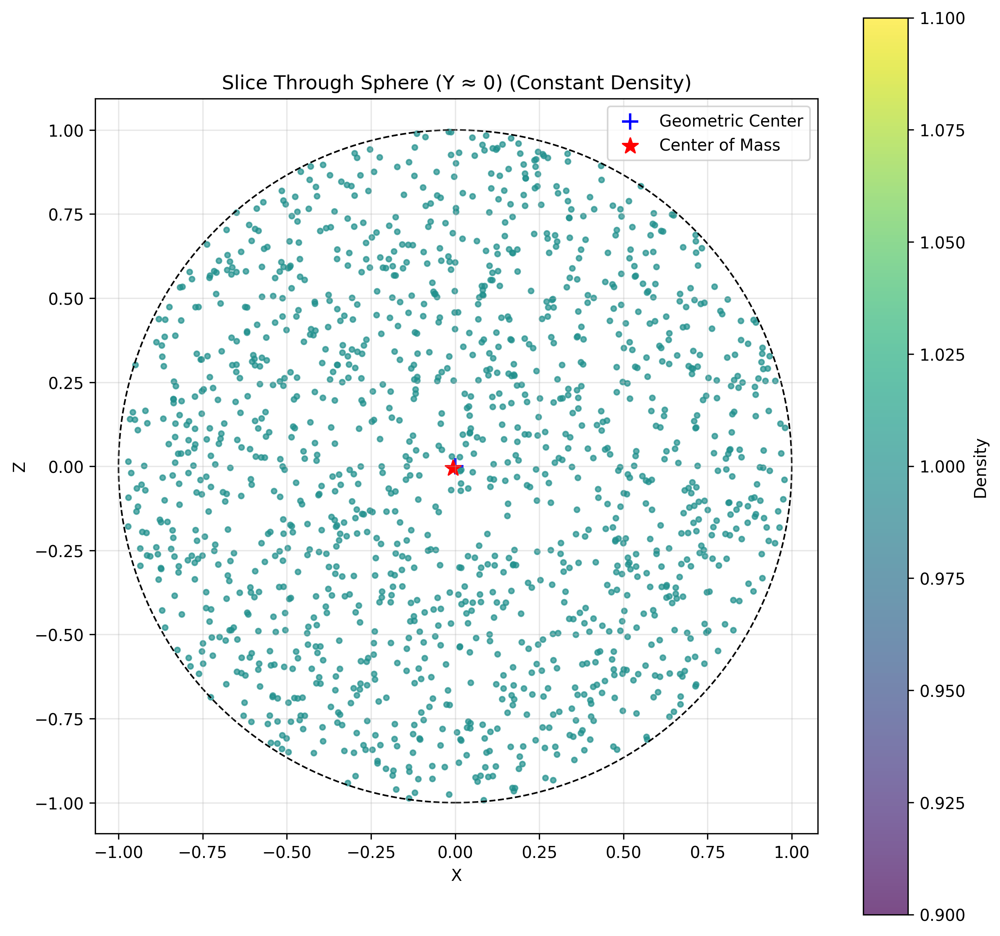

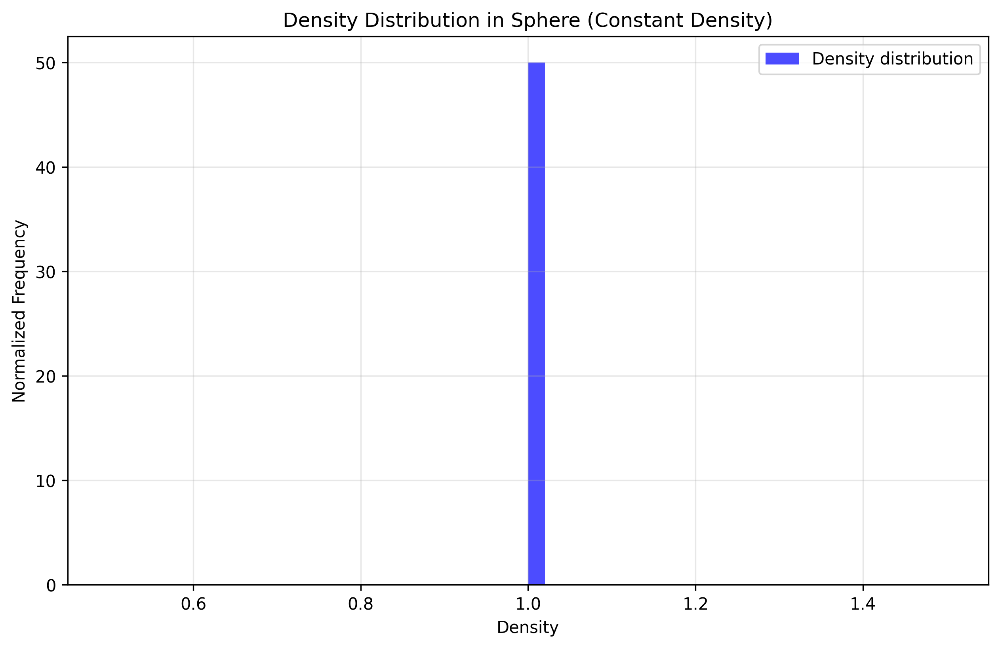

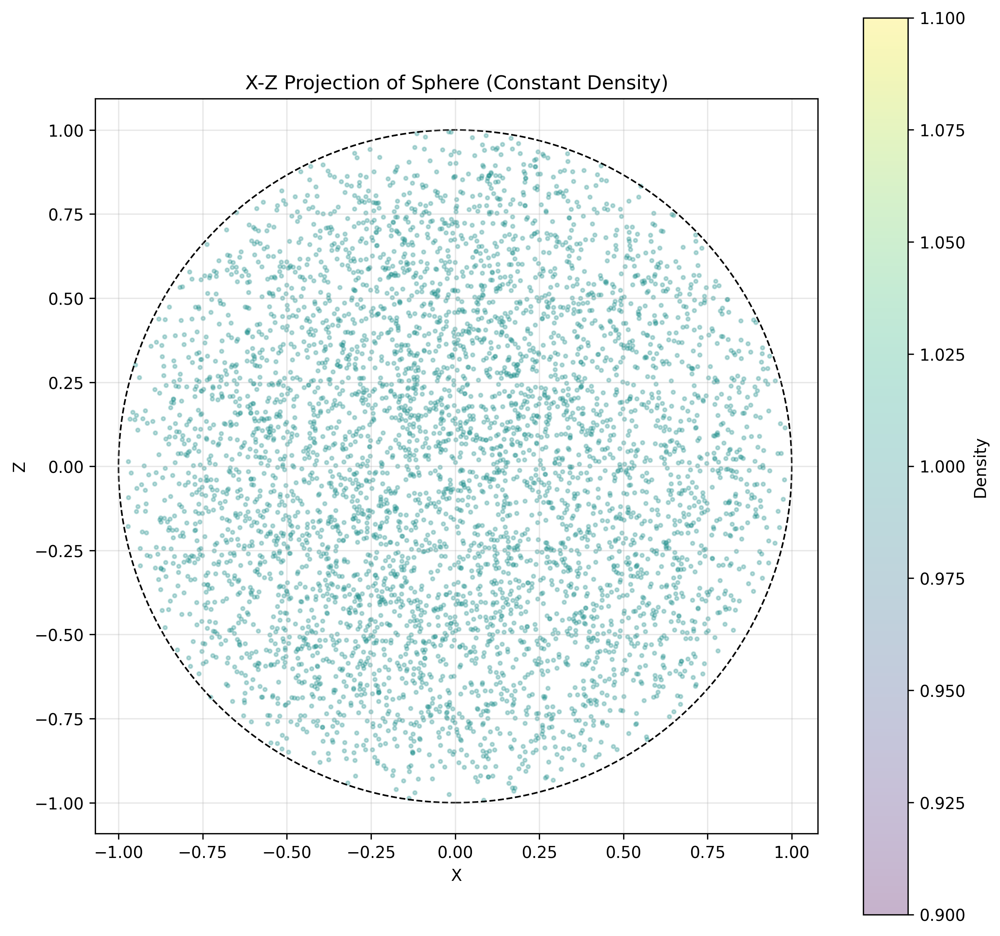

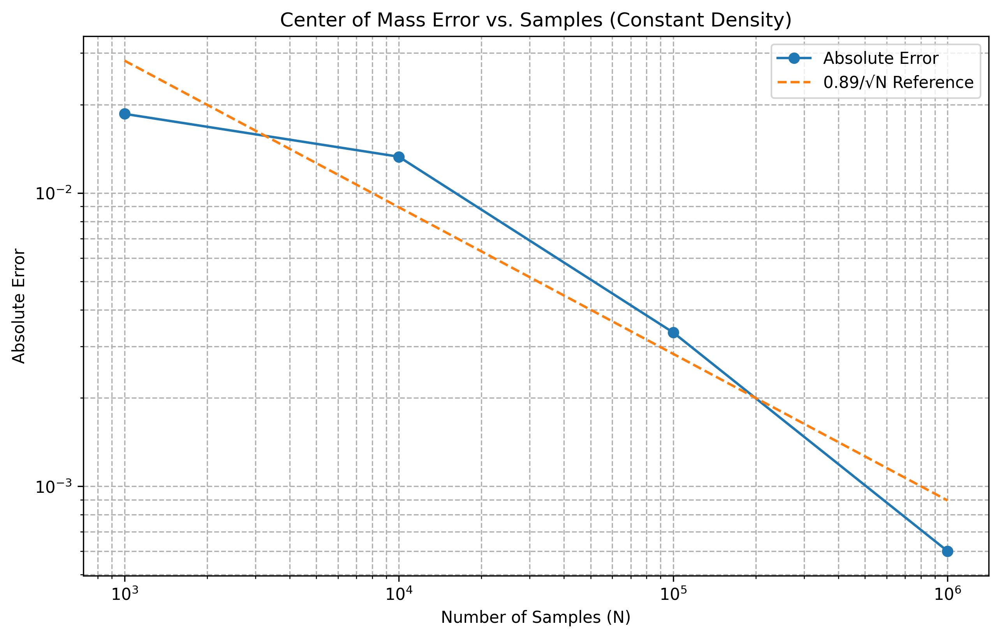

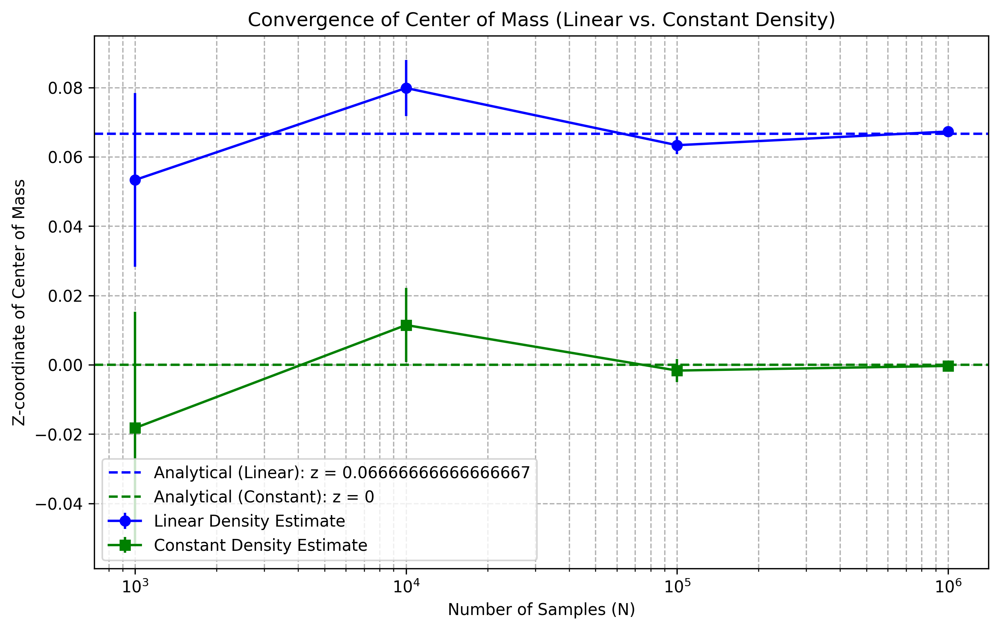

In [108]:
np.random.seed(12)

def sphere_center_of_mass(R, N, density_function):
    x = np.random.uniform(-R, R, N)
    y = np.random.uniform(-R, R, N)
    z = np.random.uniform(-R, R, N)
    
    inside_sphere = x**2 + y**2 + z**2 <= R**2
    coords = np.vstack((x, y, z)).T[inside_sphere]
    x_in, y_in, z_in = coords[:, 0], coords[:, 1], coords[:, 2]
    N_in = len(coords)
    
    if N_in == 0:
        return np.array([0, 0, 0]), float('inf'), np.zeros((0, 4))
    
    density = np.array([density_function(x, y, z, R) for x, y, z in coords])
    
    points = np.zeros((N_in, 4))
    points[:, :3] = coords
    points[:, 3] = density
    
    cube_volume = (2 * R) ** 3
    sphere_volume = (4/3) * np.pi * R**3
    volume_ratio = sphere_volume / cube_volume
    
    total_mass = np.sum(density) * (cube_volume / N_in)
    
    if total_mass > 0:
        weighted_coords = np.sum(coords * density[:, np.newaxis], axis=0) * (cube_volume / N_in)
        cm = weighted_coords / total_mass
        
        weighted_x = coords[:, 0] * density
        weighted_y = coords[:, 1] * density
        weighted_z = coords[:, 2] * density
        error_x = np.std(weighted_x) / np.sqrt(N_in)
        error_y = np.std(weighted_y) / np.sqrt(N_in)
        error_z = np.std(weighted_z) / np.sqrt(N_in)
        error = np.sqrt(error_x**2 + error_y**2 + error_z**2)
    else:
        cm = np.array([0, 0, 0])
        error = float('inf')
    
    return cm, error, points

def linear_density(x, y, z, R):
    normalized_z = z / R
    return 0.75 + 0.25 * (normalized_z)

def constant_density(x, y, z, R):
    return 1.0

def analytical_sphere_center_of_mass(R, density_name):
    if density_name == 'linear':
        return (0, 0, R/15)
    elif density_name == 'constant':
        return (0, 0, 0)
    else:
        raise ValueError("Unknown density function")

def visualize_sphere_density(R, points, cm, analytical_cm, density_name):
    fig = plt.figure(figsize=(10, 8), dpi=300)
    ax = fig.add_subplot(111, projection='3d')
    
    x, y, z = points[:, 0], points[:, 1], points[:, 2]
    density = points[:,3]
    
    scatter = ax.scatter(x, y, z, c=density, cmap='viridis', alpha=0.3, s=5)
    ax.scatter([cm[0]], [cm[1]], [cm[2]], color='red', s=100, marker='*',
               label='Monte Carlo CM')
    ax.scatter([analytical_cm[0]], [analytical_cm[1]], [analytical_cm[2]],
               color='black', s=100, marker='o', label='Analytical CM')
    ax.scatter([0], [0], [0], color='blue', s=100, marker='+',
               label='Geometric Center')
    
    cbar = plt.colorbar(scatter, ax=ax, label='Density')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(f'Sphere with {density_name.capitalize()} Density and Center of Mass')
    ax.legend()
    ax.set_box_aspect([1,1,1])
    
    plt.savefig(f'sphere_density_3d_{density_name}.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_density_profile(R, points, density_name):
    z = points[:, 2]
    density = points[:, 3]
    z_norm = z / R
    
    plt.figure(figsize=(10, 6), dpi=300)
    plt.scatter(z_norm, density, alpha=0.3, s=5, c='blue', label='Sample points')
    
    if density_name == 'linear':
        z_theory = np.linspace(-1, 1, 1000)
        density_theory = 0.75 + 0.25 * (z_theory)
        plt.plot(z_theory, density_theory, 'r-', label='Theoretical density: ρ(z) = 1 - 0.25(1 + z/R)')
    else:
        plt.axhline(y=1.0, color='r', linestyle='-', label='Theoretical density: ρ = 1')
    
    plt.xlabel('Normalized Z-coordinate (z/R)')
    plt.ylabel('Density')
    plt.title(f'Density Profile along Z-axis ({density_name.capitalize()} Density)')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    plt.savefig(f'density_profile_{density_name}.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_cm_convergence(R, N_values, cm_results, density_name):
    cm_z_values = [r[1][2] for r in cm_results]
    errors = [r[2] for r in cm_results]
    analytical_cm = analytical_sphere_center_of_mass(R, density_name)
    
    plt.figure(figsize=(10, 6), dpi=300)
    plt.errorbar(N_values, cm_z_values, yerr=errors, fmt='o-', label='Monte Carlo estimate')
    plt.axhline(y=analytical_cm[2], color='r', linestyle='--',
                label=f'Analytical value: z = {analytical_cm[2]}')
    
    plt.xscale('log')
    plt.xlabel('Number of Samples (N)')
    plt.ylabel('Z-coordinate of Center of Mass')
    plt.title(f'Convergence of Center of Mass ({density_name.capitalize()} Density)')
    plt.grid(True, which="both", ls="--")
    plt.legend()
    
    plt.savefig(f'cm_convergence_{density_name}.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_mass_distribution(R, points, cm, density_name):
    fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
    
    slice_thickness = R * 0.2
    slice_points = points[np.abs(points[:, 1]) < slice_thickness]
    
    x_slice = slice_points[:, 0]
    z_slice = slice_points[:, 2]
    density_slice = slice_points[:, 3]
    
    scatter = ax.scatter(x_slice, z_slice, c=density_slice, cmap='viridis',
                         alpha=0.7, s=10)
    ax.scatter([0], [0], color='blue', s=100, marker='+', label='Geometric Center')
    ax.scatter([cm[0]], [cm[2]], color='red', s=100, marker='*', label='Center of Mass')
    
    circle = plt.Circle((0, 0), R, fill=False, edgecolor='black', linestyle='--')
    ax.add_artist(circle)
    
    cbar = plt.colorbar(scatter, ax=ax, label='Density')
    ax.set_xlabel('X')
    ax.set_ylabel('Z')
    ax.set_title(f'Slice Through Sphere (Y ≈ 0) ({density_name.capitalize()} Density)')
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.3)
    ax.legend()
    
    plt.savefig(f'sphere_slice_{density_name}.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_density_histogram(points, density_name):
    density = points[:, 3]
    
    plt.figure(figsize=(10, 6), dpi=300)
    plt.hist(density, bins=50, density=True, alpha=0.7, color='blue',
             label='Density distribution')
    
    plt.xlabel('Density')
    plt.ylabel('Normalized Frequency')
    plt.title(f'Density Distribution in Sphere ({density_name.capitalize()} Density)')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    plt.savefig(f'density_histogram_{density_name}.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_xz_projection(R, points, density_name):
    plt.figure(figsize=(10, 10), dpi=300)
    
    x = points[:, 0]
    z = points[:, 2]
    density = points[:, 3]
    
    scatter = plt.scatter(x, z, c=density, cmap='viridis', alpha=0.3, s=5)
    
    circle = plt.Circle((0, 0), R, fill=False, edgecolor='black', linestyle='--')
    plt.gca().add_artist(circle)
    
    cbar = plt.colorbar(scatter, label='Density')
    plt.xlabel('X')
    plt.ylabel('Z')
    plt.title(f'X-Z Projection of Sphere ({density_name.capitalize()} Density)')
    plt.gca().set_aspect('equal')
    plt.grid(True, alpha=0.3)
    
    plt.savefig(f'xz_projection_{density_name}.png', dpi=300, bbox_inches='tight')
    plt.show()

def visualize_combined_convergence(R, N_values, cm_results_linear, cm_results_constant):
    cm_z_linear = [r[1][2] for r in cm_results_linear]
    errors_linear = [r[2] for r in cm_results_linear]
    cm_z_constant = [r[1][2] for r in cm_results_constant]
    errors_constant = [r[2] for r in cm_results_constant]
    
    analytical_cm_linear = analytical_sphere_center_of_mass(R, 'linear')
    analytical_cm_constant = analytical_sphere_center_of_mass(R, 'constant')
    
    plt.figure(figsize=(10, 6), dpi=300)
    plt.errorbar(N_values, cm_z_linear, yerr=errors_linear, fmt='o-',
                 label='Linear Density Estimate', color='blue')
    plt.errorbar(N_values, cm_z_constant, yerr=errors_constant, fmt='s-',
                 label='Constant Density Estimate', color='green')
    plt.axhline(y=analytical_cm_linear[2], color='blue', linestyle='--',
                label=f'Analytical (Linear): z = {analytical_cm_linear[2]}')
    plt.axhline(y=analytical_cm_constant[2], color='green', linestyle='--',
                label=f'Analytical (Constant): z = {analytical_cm_constant[2]}')
    
    plt.xscale('log')
    plt.xlabel('Number of Samples (N)')
    plt.ylabel('Z-coordinate of Center of Mass')
    plt.title('Convergence of Center of Mass (Linear vs. Constant Density)')
    plt.grid(True, which="both", ls="--")
    plt.legend()
    
    plt.savefig('cm_convergence_combined.png', dpi=300, bbox_inches='tight')
    plt.show()

print("\n=== Problem 3: Center of Mass of a Sphere with Density Variations ===")
R = 1.0
N_values = [1000, 10000, 100000, 1000000]

cm_results_linear = []
cm_results_constant = []

for density_name, density_func in [('linear', linear_density), ('constant', constant_density)]:
    print(f"\nTesting with {density_name} density distribution:")
    analytical_cm = analytical_sphere_center_of_mass(R, density_name)
    print(f"Analytical center of mass: {analytical_cm}")
    
    cm_results = []
    for N in N_values:
        start_time = time.time()
        cm, error, points = sphere_center_of_mass(R, N, density_func)
        execution_time = time.time() - start_time
        
        actual_error = np.sqrt(sum((c - a)**2 for c, a in zip(cm, analytical_cm)))
        
        cm_results.append([N, cm, error, actual_error, execution_time])
        print(f"N={N}, Center of Mass={cm}, Statistical Error={error:.6f}, "
              f"Actual Error={actual_error:.6f}, Time={execution_time:.6f}s")
    
    print("\nResults Table:")
    print("N\tCenter of Mass\t\t\tStat Error\tActual Error\tTime (s)")
    print("-" * 80)
    for result in cm_results:
        cm_str = f"({result[1][0]:.4f}, {result[1][1]:.4f}, {result[1][2]:.4f})"
        print(f"{result[0]}\t{cm_str}\t{result[2]:.6f}\t{result[3]:.6f}\t{result[4]:.6f}")
    
    if density_name == 'linear':
        cm_results_linear = cm_results
    else:
        cm_results_constant = cm_results
    
    N_viz = 10000
    cm_viz, _, points_viz = sphere_center_of_mass(R, N_viz, density_func)
    
    visualize_sphere_density(R, points_viz, cm_viz, analytical_cm, density_name)
    visualize_density_profile(R, points_viz, density_name)
    visualize_cm_convergence(R, N_values, cm_results, density_name)
    visualize_mass_distribution(R, points_viz, cm_viz, density_name)
    visualize_density_histogram(points_viz, density_name)
    visualize_xz_projection(R, points_viz, density_name)
    
    plt.figure(figsize=(10, 6), dpi=300)
    N_plot = [r[0] for r in cm_results]
    errors_plot = [r[3] for r in cm_results]
    
    scaling_factor = np.mean([errors_plot[i] * np.sqrt(N_plot[i]) for i in range(len(N_plot))])
    plt.loglog(N_plot, errors_plot, 'o-', label='Absolute Error')
    plt.loglog(N_plot, scaling_factor / np.sqrt(N_plot), '--',
               label=f'{scaling_factor:.2f}/√N Reference')
    
    plt.xlabel('Number of Samples (N)')
    plt.ylabel('Absolute Error')
    plt.title(f'Center of Mass Error vs. Samples ({density_name.capitalize()} Density)')
    plt.grid(True, which="both", ls="--")
    plt.legend()
    
    plt.savefig(f'cm_error_{density_name}.png', dpi=300, bbox_inches='tight')
    plt.show()

visualize_combined_convergence(R, N_values, cm_results_linear, cm_results_constant)